In [1]:
import re

# Read the raw HTML snippet
with open('rough_illicit_list.txt', 'r', encoding='utf-8') as f:
    html = f.read()

# Extract domain names from href query parameters
domains = re.findall(r'href="https?://[^"]*\?url=([^"]+)"', html)

# Write to new file
with open('clean_illicit_list.txt', 'w', encoding='utf-8') as f:
    for d in domains:
        f.write(f"{d}\n")

print(f"Extracted {len(domains)} domains to clean_illicit_list.txt")


Extracted 44258 domains to clean_illicit_list.txt


In [ ]:
import requests
from bs4 import BeautifulSoup
import re
import csv

# 1. load your list of domains
with open('clean_illicit_list.txt', encoding='utf-8') as f:
    domains = [line.strip() for line in f if line.strip()]

# 2. define your keywords
noprescription = [
    "no prescription required",
    "no prescription needed",
    "without prescription",
    "no rx needed",
    "no rx required",
    "no doctor visit",
]

drugs = [
    "xanax", "valium", "tramadol", "oxycodone", "hydrocodone", "percocet",
    "adderall", "fentanyl", "morphine", "codeine", "hydromorphone",
    "oxymorphone", "dilaudid", "suboxone", "buprenorphine", "oxicontin",
    "vicodin", "roxicodone", "viagra", "cialis", "levitra", "kamagra",
    "sildenafil", "tadalafil", "vardenafil", "stendra"
]


new_generated =[

  "viagra",
  "v1agra",
  "vi@gra",
  "cialis",
  "c1alis",
  "cial1s",
  "xanax",
  "x@nax",
  "tramadol",
  "tr4madol",
  "oxycodone",
  "0xycodone",
  "hydrocodone",
  "hydroc0done",
  "fentanyl",
  "fentany1",
  "morphine",
  "m0rphine",
  "codeine",
  "c0deine",
  "percocet",
  "perc0cet",
  "suboxone",
  "sub0xone",
  "adderall",
  "adderal",
  "methadone",
  "methedone",


  "rx",
  "pharma",
  "pharm",
  "drugstore",
  "drugstoreonline",
  "pharmacy",
  "pharmacyonline",
  "meds",
  "medsonline",
  "pills",
  "pills4u",
  "genericdrugs",
  "generics",
  "epharmacy",


  "no prescription",
  "no rx",
  "no script",
  "no questions asked",
  "cheap pills",
  "cheapmeds",
  "discounted meds",
  "lowest price",
  "wholesale",
  "generic without prescription",
  "fda approved",
  "fast delivery",
  "24/7 service",
  "24hr shipping",


  "bitcoin accepted",
  "btc accepted",
  "cryptocurrency",
  "western union",
  "moneygram",
  "wire transfer",
  "cash on delivery",
  "cod available",
  "overnight delivery",
  "express shipping",
  "bulk discount",
  "bulk order",
  "bulk meds",
  "affiliate program",


  "canada pharmacy",
  "canadian pharmacy",
  "canadian meds",
  "india pharmacy",
  "india meds",
  "mexico pharmacy",
  "international pharmacy",
  "overseas pharmacy",
  "uk drugs",
  "european pharmacy",
  "australia pharmacy",
  "asian pharmacy"
]


# combine the result
all_terms = noprescription + drugs + new_generated


# pre‑compile regexes for speed (case‑insensitive, whole‑word)
regexes = {
    term: re.compile(r'\b' + re.escape(term) + r'\b', re.IGNORECASE)
    for term in all_terms
}

# 3. open output files
csv_file = open('keyword_statistic.csv', 'w', newline='', encoding='utf-8')
writer = csv.writer(csv_file)
writer.writerow(['domain'] + all_terms)

alive_file = open('existing_domains.txt', 'w', encoding='utf-8')

# 4. scrape each site
for dom in domains:
    url = f'https://{dom}'
    try:
        r = requests.get(url, timeout=10)
    except Exception as e:
        print(f'❌ {dom} fail：{e}')
        continue

    if r.status_code != 200:
        print(f'⚠️ {dom}  {r.status_code}, skip')
        continue

    # record valid
    alive_file.write(dom + '\n')

    # extract text
    text = BeautifulSoup(r.text, 'html.parser').get_text(separator=' ')
    counts = [len(regex.findall(text)) for regex in regexes.values()]
    writer.writerow([dom] + counts)
    print(f'✅ {dom} can access {sum(counts)}')

# 5. close files
csv_file.close()
alive_file.close()

print("Finished：")
print("  • keyword_counts.csv → all key word count")
print("  • existing_domains.txt → all valid list")


❌ 003us.com 请求失败：HTTPSConnectionPool(host='003us.com', port=443): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000021861D21F90>: Failed to resolve '003us.com' ([Errno 11001] getaddrinfo failed)"))
❌ 007bestbuy.com 请求失败：HTTPSConnectionPool(host='007bestbuy.com', port=443): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000021861D23C50>: Failed to resolve '007bestbuy.com' ([Errno 11001] getaddrinfo failed)"))
❌ 0cialis.monster 请求失败：HTTPSConnectionPool(host='0cialis.monster', port=443): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000021861D237D0>: Failed to resolve '0cialis.monster' ([Errno 11001] getaddrinfo failed)"))
❌ 0cialis.quest 请求失败：HTTPSConnectionPool(host='0cialis.quest', port=443): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPSConne

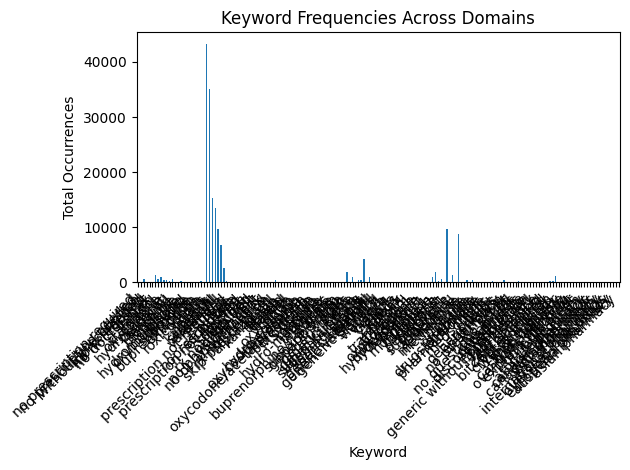

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the keyword counts CSV
df = pd.read_csv('keyword_statistic.csv')

# Sum occurrences for each keyword (exclude the 'domain' column)
keyword_sums = df.drop(columns=['domain']).sum()

# Plot bar chart
plt.figure()
keyword_sums.plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Keyword')
plt.ylabel('Total Occurrences')
plt.title('Keyword Frequencies Across Domains')
plt.tight_layout()
plt.show()


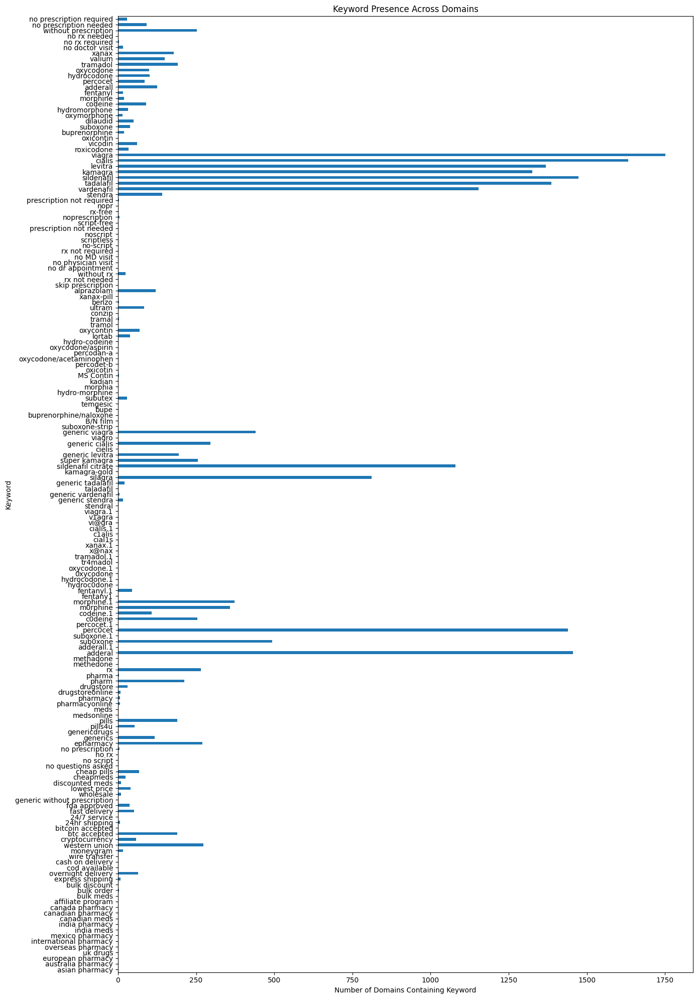

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df = pd.read_csv('keyword_statistic.csv')

presence = df.drop(columns=['domain']) > 0

domain_counts = presence.sum(axis=0)


# 横向条形图
plt.figure(figsize=(14, 20), dpi=100)
ax = domain_counts.plot(kind='barh')
ax.invert_yaxis()
plt.xlabel('Number of Domains Containing Keyword')
plt.ylabel('Keyword')
plt.title('Keyword Presence Across Domains')
plt.tight_layout()
plt.show()


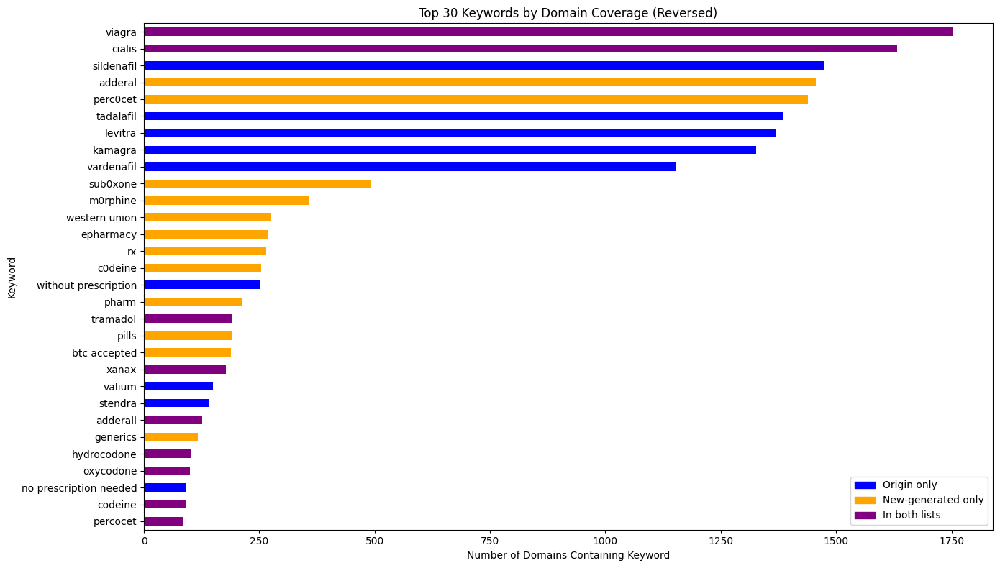

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# 原始列表
origin = [
    "no prescription required","no prescription needed","without prescription",
    "no rx needed","no rx required","no doctor visit",
    "xanax","valium","tramadol","oxycodone","hydrocodone","percocet",
    "adderall","fentanyl","morphine","codeine","hydromorphone",
    "oxymorphone","dilaudid","suboxone","buprenorphine","oxicontin",
    "vicodin","roxicodone","viagra","cialis","levitra","kamagra",
    "sildenafil","tadalafil","vardenafil","stendra"
]

new_generated = [
    "viagra","v1agra","vi@gra","cialis","c1alis","cial1s",
    "xanax","x@nax","tramadol","tr4madol","oxycodone","0xycodone",
    "hydrocodone","hydroc0done","fentanyl","fentany1","morphine",
    "m0rphine","codeine","c0deine","percocet","perc0cet","suboxone",
    "sub0xone","adderall","adderal","methadone","methedone",
    "rx","pharma","pharm","drugstore","drugstoreonline","pharmacy",
    "pharmacyonline","meds","medsonline","pills","pills4u",
    "genericdrugs","generics","epharmacy",
    "no prescription","no rx","no script","no questions asked",
    "cheap pills","cheapmeds","discounted meds","lowest price",
    "wholesale","generic without prescription","fda approved",
    "fast delivery","24/7 service","24hr shipping",
    "bitcoin accepted","btc accepted","cryptocurrency",
    "western union","moneygram","wire transfer","cash on delivery",
    "cod available","overnight delivery","express shipping",
    "bulk discount","bulk order","bulk meds","affiliate program",
    "canada pharmacy","canadian pharmacy","canadian meds",
    "india pharmacy","india meds","mexico pharmacy",
    "international pharmacy","overseas pharmacy","uk drugs",
    "european pharmacy","australia pharmacy","asian pharmacy"
]

origin_set   = set(origin)
new_set      = set(new_generated)
intersection = origin_set & new_set

df = pd.read_csv('keyword_statistic.csv')
presence = df.drop(columns=['domain']) > 0
domain_counts = presence.sum(axis=0)

counts = domain_counts.loc[domain_counts.index.isin(origin_set | new_set)]
top20 = counts.sort_values(ascending=False).head(30).iloc[::-1]
colors = [
    'purple' if kw in intersection
    else ('blue' if kw in origin_set else 'orange')
    for kw in top20.index
]

plt.figure(figsize=(14, 8), dpi=100)
ax = top20.plot(kind='barh', color=colors)
plt.xlabel('Number of Domains Containing Keyword')
plt.ylabel('Keyword')
plt.title('Top 30 Keywords by Domain Coverage (Reversed)')


legend_patches = [
    Patch(color='blue',   label='Origin only'),
    Patch(color='orange', label='New-generated only'),
    Patch(color='purple', label='In both lists'),
]
ax.legend(handles=legend_patches, loc='lower right')

plt.tight_layout()
plt.show()



Top 30 keywords by domain coverage:
viagra: 1752 domains
cialis: 1633 domains
sildenafil: 1473 domains
adderal: 1456 domains
perc0cet: 1439 domains
tadalafil: 1386 domains
levitra: 1369 domains
kamagra: 1326 domains
vardenafil: 1153 domains
sub0xone: 493 domains
m0rphine: 358 domains
western union: 274 domains
epharmacy: 270 domains
rx: 265 domains
c0deine: 254 domains
without prescription: 252 domains
pharm: 212 domains
tramadol: 192 domains
pills: 190 domains
btc accepted: 189 domains
xanax: 178 domains
valium: 149 domains
stendra: 142 domains
adderall: 126 domains
generics: 117 domains
hydrocodone: 101 domains
oxycodone: 99 domains
no prescription needed: 92 domains
codeine: 90 domains
percocet: 85 domains


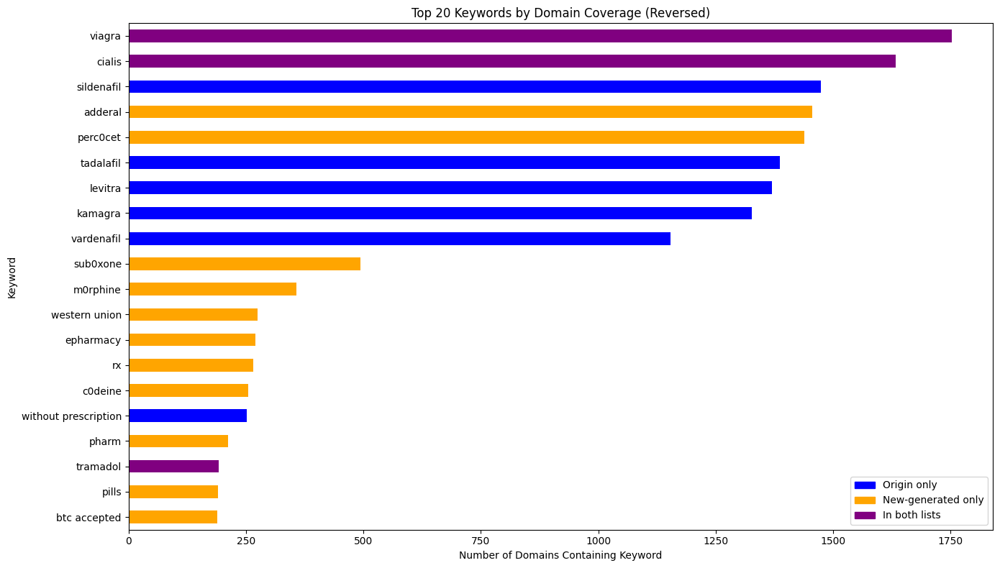

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# 原始列表
origin = [
    "no prescription required","no prescription needed","without prescription",
    "no rx needed","no rx required","no doctor visit",
    "xanax","valium","tramadol","oxycodone","hydrocodone","percocet",
    "adderall","fentanyl","morphine","codeine","hydromorphone",
    "oxymorphone","dilaudid","suboxone","buprenorphine","oxicontin",
    "vicodin","roxicodone","viagra","cialis","levitra","kamagra",
    "sildenafil","tadalafil","vardenafil","stendra"
]

new_generated = [
    "viagra","v1agra","vi@gra","cialis","c1alis","cial1s",
    "xanax","x@nax","tramadol","tr4madol","oxycodone","0xycodone",
    "hydrocodone","hydroc0done","fentanyl","fentany1","morphine",
    "m0rphine","codeine","c0deine","percocet","perc0cet","suboxone",
    "sub0xone","adderall","adderal","methadone","methedone",
    "rx","pharma","pharm","drugstore","drugstoreonline","pharmacy",
    "pharmacyonline","meds","medsonline","pills","pills4u",
    "genericdrugs","generics","epharmacy",
    "no prescription","no rx","no script","no questions asked",
    "cheap pills","cheapmeds","discounted meds","lowest price",
    "wholesale","generic without prescription","fda approved",
    "fast delivery","24/7 service","24hr shipping",
    "bitcoin accepted","btc accepted","cryptocurrency",
    "western union","moneygram","wire transfer","cash on delivery",
    "cod available","overnight delivery","express shipping",
    "bulk discount","bulk order","bulk meds","affiliate program",
    "canada pharmacy","canadian pharmacy","canadian meds",
    "india pharmacy","india meds","mexico pharmacy",
    "international pharmacy","overseas pharmacy","uk drugs",
    "european pharmacy","australia pharmacy","asian pharmacy"
]

origin_set   = set(origin)
new_set      = set(new_generated)
intersection = origin_set & new_set

# 读取并处理
df = pd.read_csv('keyword_statistic.csv')
presence = df.drop(columns=['domain']) > 0
domain_counts = presence.sum(axis=0)

# 只保留感兴趣的关键词
counts = domain_counts.loc[domain_counts.index.isin(origin_set | new_set)]

# —— 文本输出前 30 —— 
top30 = counts.sort_values(ascending=False).head(30)
print("Top 30 keywords by domain coverage:")
for kw, cnt in top30.items():
    print(f"{kw}: {cnt} domains")

# —— 绘图部分（前 20，颠倒顺序） —— 
top20 = top30.head(20).iloc[::-1]  # 等价于 counts.sort_values(desc).head(20).iloc[::-1]

colors = [
    'purple' if kw in intersection
    else ('blue' if kw in origin_set else 'orange')
    for kw in top20.index
]

plt.figure(figsize=(14, 8), dpi=100)
ax = top20.plot(kind='barh', color=colors)
plt.xlabel('Number of Domains Containing Keyword')
plt.ylabel('Keyword')
plt.title('Top 20 Keywords by Domain Coverage (Reversed)')

legend_patches = [
    Patch(color='blue',   label='Origin only'),
    Patch(color='orange', label='New-generated only'),
    Patch(color='purple', label='In both lists'),
]
ax.legend(handles=legend_patches, loc='lower right')

plt.tight_layout()
plt.show()


In [ ]:
origin = [
    "no prescription required",
    "no prescription needed",
    "without prescription",
    "no rx needed",
    "no rx required",
    "no doctor visit",
    "xanax", "valium", "tramadol", "oxycodone", "hydrocodone", "percocet",
    "adderall", "fentanyl", "morphine", "codeine", "hydromorphone",
    "oxymorphone", "dilaudid", "suboxone", "buprenorphine", "oxicontin",
    "vicodin", "roxicodone", "viagra", "cialis", "levitra", "kamagra",
    "sildenafil", "tadalafil", "vardenafil", "stendra"
]



new_generated =[

  "viagra",
  "v1agra",
  "vi@gra",
  "cialis",
  "c1alis",
  "cial1s",
  "xanax",
  "x@nax",
  "tramadol",
  "tr4madol",
  "oxycodone",
  "0xycodone",
  "hydrocodone",
  "hydroc0done",
  "fentanyl",
  "fentany1",
  "morphine",
  "m0rphine",
  "codeine",
  "c0deine",
  "percocet",
  "perc0cet",
  "suboxone",
  "sub0xone",
  "adderall",
  "adderal",
  "methadone",
  "methedone",


  "rx",
  "pharma",
  "pharm",
  "drugstore",
  "drugstoreonline",
  "pharmacy",
  "pharmacyonline",
  "meds",
  "medsonline",
  "pills",
  "pills4u",
  "genericdrugs",
  "generics",
  "epharmacy",


  "no prescription",
  "no rx",
  "no script",
  "no questions asked",
  "cheap pills",
  "cheapmeds",
  "discounted meds",
  "lowest price",
  "wholesale",
  "generic without prescription",
  "fda approved",
  "fast delivery",
  "24/7 service",
  "24hr shipping",


  "bitcoin accepted",
  "btc accepted",
  "cryptocurrency",
  "western union",
  "moneygram",
  "wire transfer",
  "cash on delivery",
  "cod available",
  "overnight delivery",
  "express shipping",
  "bulk discount",
  "bulk order",
  "bulk meds",
  "affiliate program",


  "canada pharmacy",
  "canadian pharmacy",
  "canadian meds",
  "india pharmacy",
  "india meds",
  "mexico pharmacy",
  "international pharmacy",
  "overseas pharmacy",
  "uk drugs",
  "european pharmacy",
  "australia pharmacy",
  "asian pharmacy"
]

origin(baseline): 2216 / 7794 域名被命中，命中率 = 28.43%
Pure AI-generated: 2673 / 7794 域名被命中，命中率 = 34.30%


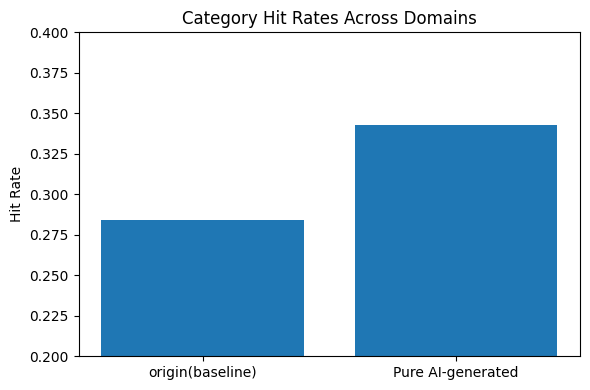

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# 读入 CSV
df = pd.read_csv('keyword_statistic.csv')

# 只保留关键词列，判断在该域名下是否出现（>0）
presence = df.drop(columns=['domain']) > 0

# 定义你的三个类别列表
categories = {
    'origin(baseline)': origin,
    # 'origin + synonyms': origin_syn,
    "Pure AI-generated":new_generated,
}

total_domains = len(df)
hit_counts = {}
hit_rates = {}

# 计算每个类别的命中数和命中率
for cat, kw_list in categories.items():
    # 对每个域名，只要有任何一个关键词出现就算命中
    cat_hit = presence[kw_list].any(axis=1)
    count = cat_hit.sum()
    rate = count / total_domains
    hit_counts[cat] = count
    hit_rates[cat] = rate
    print(f"{cat}: {count} / {total_domains} 域名被命中，命中率 = {rate:.2%}")

# 可视化命中率
plt.figure(figsize=(6,4))
plt.bar(hit_rates.keys(), [hit_rates[c] for c in hit_rates])
plt.ylabel('Hit Rate')
plt.ylim(0.2, 0.4)
plt.title('Category Hit Rates Across Domains')
plt.tight_layout()
plt.show()


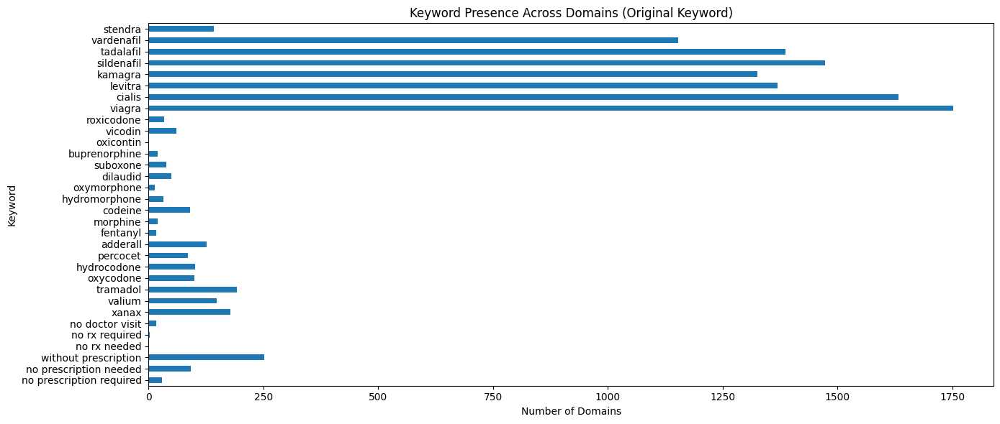

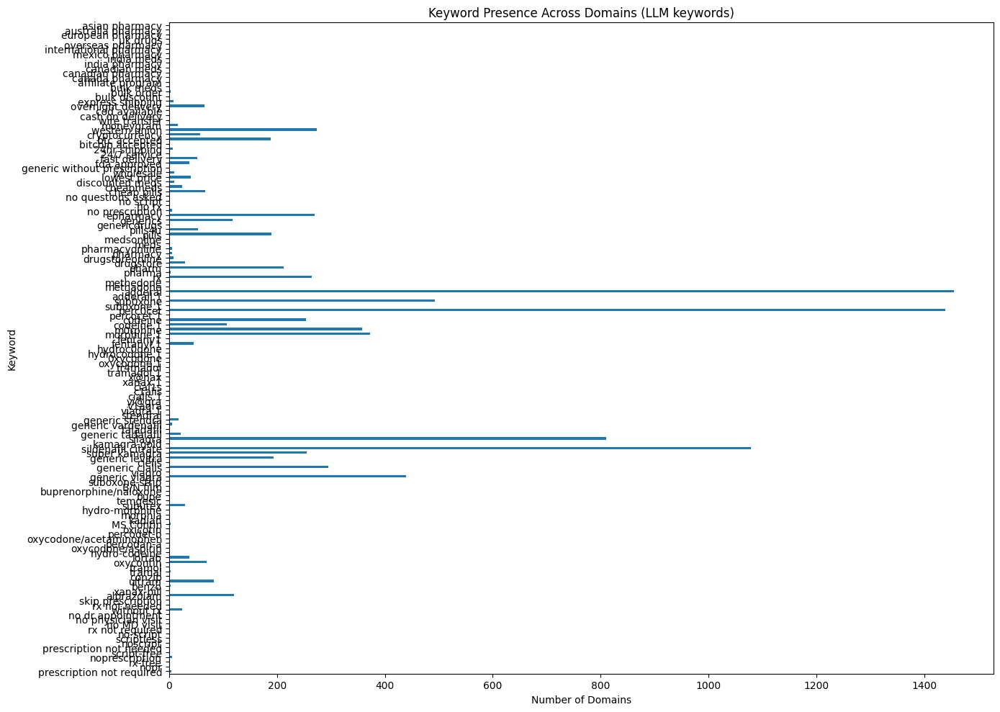

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the keyword counts CSV
df = pd.read_csv('keyword_statistic.csv')

# Calculate presence per domain
presence = df.drop(columns=['domain']) > 0
domain_counts = presence.sum(axis=0)

# Find split position at 'stendra'
keywords = list(domain_counts.index)
split_idx = keywords.index('stendra')

# Split into two parts
part1 = domain_counts.iloc[:split_idx+1]
part2 = domain_counts.iloc[split_idx+1:]

# Set figure size and DPI
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['figure.dpi'] = 100

# Plot Part 1
plt.figure()
part1.plot(kind='barh')
plt.title('Keyword Presence Across Domains (Original Keyword)')
plt.xlabel('Number of Domains')
plt.ylabel('Keyword')
plt.tight_layout()
plt.show()
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['figure.dpi'] = 100
# Plot Part 2
plt.figure()
part2.plot(kind='barh')
plt.title('Keyword Presence Across Domains (LLM keywords)')
plt.xlabel('Number of Domains')
plt.ylabel('Keyword')
plt.tight_layout()
plt.show()


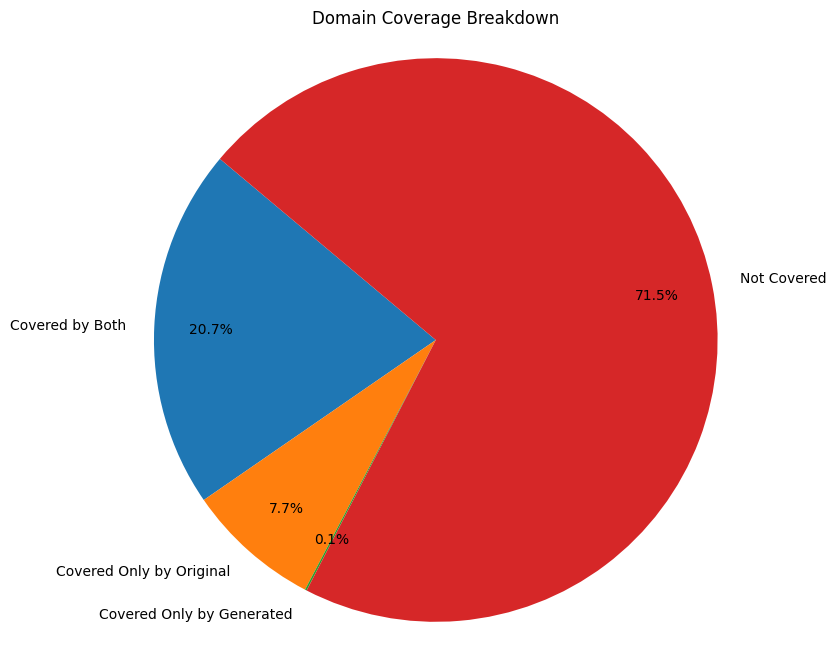

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# 读入 CSV，假设第一列是 domain，其余列是各关键词在该域名下的出现次数
df = pd.read_csv('keyword_statistic.csv')

# 布尔型 DataFrame：每个域名下，哪个关键词出现过
presence = df.drop(columns=['domain']) > 0

# 定义原始和生成的关键词列表（名称要与 CSV 列名一致）
original_terms = [
    "no prescription required", "no prescription needed", "without prescription",
    "no rx needed", "no rx required", "no doctor visit",
    "xanax", "valium", "tramadol", "oxycodone", "hydrocodone", "percocet",
    "adderall", "fentanyl", "morphine", "codeine", "hydromorphone",
    "oxymorphone", "dilaudid", "suboxone", "buprenorphine", "oxicontin",
    "vicodin", "roxicodone", "viagra", "cialis", "levitra", "kamagra",
    "sildenafil", "tadalafil", "vardenafil", "stendra"
]
generated_terms = [
    # 跳过处方术语
    "prescription not required", "nopr", "rx-free", "noprescription",
    "script-free", "prescription not needed",
    "noscript", "scriptless", "no-script",
    "rx not required",
    "no MD visit", "no physician visit", "no dr appointment",
    "without rx", "rx not needed", "skip prescription",

    # 镇痛／安眠药变形
    "alprazolam", "xanax-pill", "benzo",
    "ultram", "conzip", "tramal", "tramol",
    "oxycontin",
    "lortab", "hydro-codeine",
    "oxycodone/aspirin", "percodan-a",
    "oxycodone/acetaminophen", "percodet-b",
    "oxicotin", "MS Contin", "kadian", "morphia",
    "hydro-morphine", "subutex", "temgesic", "bupe",
    "buprenorphine/naloxone", "B/N film", "suboxone-strip",

    # 勃起功能障碍药变形
    "generic viagra", "viagro",
    "generic cialis", "cielis",
    "generic levitra",
    "super kamagra", "sildenafil citrate", "kamagra-gold",
    "silagra", "generic tadalafil", "taladafil",
    "generic vardenafil",
    "generic stendra", "stendral"
]

# 计算每个域名是否被原始/生成列表覆盖
orig_presence = presence[original_terms].any(axis=1)
gen_presence  = presence[generated_terms].any(axis=1)

# 四类掩码
both_mask      = orig_presence & gen_presence
orig_only_mask = orig_presence & ~gen_presence
gen_only_mask  = gen_presence  & ~orig_presence
none_mask      = ~(orig_presence | gen_presence)

counts = [
    both_mask.sum(),
    orig_only_mask.sum(),
    gen_only_mask.sum(),
    none_mask.sum()
]
labels = [
    'Covered by Both',
    'Covered Only by Original',
    'Covered Only by Generated',
    'Not Covered'
]

# 画饼图
plt.figure(figsize=(8,8))
plt.pie(
    counts, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=140, 
    pctdistance=0.8
)
plt.title('Domain Coverage Breakdown')
plt.axis('equal')
plt.show()
